# Лабораторная работа №n

Набор данных: ссылка

## Задание



## Контрольные вопросы



## Теория

Облако точек - это самый простой способ представления различных объектов в виде неупорядоченного набора точек в трехмерной плоскости. Такие данные можно получить с помощью сканирования предметов или их структуры с помощью 3D-датчиков, например LiDAR. Качественные облака точек с высокой точностью измерения позволяют представить цифровую версию реального мира.

<figure>
<center>
<img src='https://www.codeproject.com/KB/openGL/839389/bunny_points.PNG' />
<figcaption>Стэндфордский кролик</figcaption></center>
</figure>

Как правило, при глубоком обучении трехмерного облака точек необходимо решить две задачи: классификацию и сегментацию.
Основная проблема работы с облаком точек заключается в том, что типичная сверточная архитектура требует упорядоченный формат входных данных (например, изображение). Поскольку облако точек не является таким, общепринятые подходы заключаются в преобразовании данных в обычную 3D-воксельную сетку или проекцию.

В данной лабораторной работе используется эффективный подход для сегментации - DBSCAN.

DBSCAN (кластеризация на основе плотности) - плотностной алгоритм пространственной кластеризации с присутствием шума. Он определяет кластер произвольной формы в пространстве как максимальный набор точек, связанных достаточно высокой плотностью. Каждый объект, не содержащийся ни в одном кластере, автоматически считается шумом. Этот метод чувствителен к таким параметрам, как эпсилон (eps) и количество образцов в окрестностях для точки, которую следует рассматривать как основную точку (min_pts).

<figure>
<center>
<img src='https://www.researchgate.net/publication/342871651/figure/fig3/AS:912165510840320@1594488613526/The-graphical-representation-of-the-key-components-of-the-DBSCAN-algorithm-a-a.png' />
<figcaption>Работа алгоритма DBSCAN: (a) кластер, (b) основная точка (синяя точка), (c) пограничная точка (желтая точка), (d) точки, доступные для области</figcaption></center>
</figure>

DBSCAN выполняет итерацию по случайным точкам в наборе данных. Для каждой рассматриваемой точки он вычисляет окрестности этой точки, и если эта окрестность содержит более определенного количества точек, она включается в область. Каждая соседняя точка проходит через один и тот же процесс до тех пор, пока она больше не сможет расширять кластер. Если рассматриваемая точка не является внутренней точкой, т.е. у нее недостаточно соседей, она будет помечена как шум. Это позволяет DBSCAN быть устойчивым к выбросам.

## Импорт библиотек

In [820]:
#pip install

In [2]:
import numpy as np
import math
import pandas as pd
import seaborn as sns
import h5py
import os
import glob
import open3d as o3d
from sklearn.cluster import DBSCAN, OPTICS
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from kneed import KneeLocator
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from itertools import product
from random import randrange

Метки (labels) варьируются от -1 до n, где -1 указывает, что это точка с "шумом", а значения от 0 до n - это метки кластера, присвоенные соответствующей точке. Для удобства каждой точке определенной метки присваивается свой цвет.

max_label сохраняет максимальное значение в списке меток. Для зашумленных точек со значением метки "-1" позже присваивается значение черного цвета (black).

In [3]:
def segment_pcd_old(X, pcd, points, user_eps, user_min_samp):
    clustering = DBSCAN(eps=user_eps, min_samples=user_min_samp, algorithm='ball_tree').fit(X)

    labels=clustering.labels_

    max_label = labels.max() + 1

    obj_points=[]
    for i in range(max_label):
        idx_labels = np.where(labels==i)
        obj_points.append(points[idx_labels])

    idx_layer=np.where(labels<0)
    colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
    colors[labels < 0] = 0
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

    return pcd, colors, max_label, obj_points

In [4]:
# функция для сегментации
def segment_pcd(X, pcd, points, user_eps, user_min_samp, max_clusters, handle_noises):
    clustering = DBSCAN(eps=user_eps, min_samples=user_min_samp, algorithm='ball_tree').fit(X)

    labels=clustering.labels_

    max_label = labels.max() + 1
    
    #--------------------------------------------
    
    if(max_label > max_clusters):
    
        unique_labels, counts = np.unique(labels, axis=0, return_counts=True)
        dic = dict(zip(unique_labels, counts))
        print(dic)

        num_of_points = min(counts[1:5])
        indexes_of_max = []
        for i in range(max_clusters):
            for j in range(num_of_points):
                indexes_of_max.append(np.where(labels==i)[0][-j])

        min_dist = 1000

        for i in range(max_clusters, max_label): # обработка неудавшихся кластеров
            index = np.where(labels==i)[0][0]
            #index = index[len(index)-1]
            for j in range(num_of_points):
                for k in range(max_clusters):
                    dist = math.dist(X[index], X[indexes_of_max[j+k*num_of_points]])
                    if (dist <= min_dist):
                        min_dist = dist
                        min_dist_index = k
            labels[labels==i] = min_dist_index

        if(handle_noises):
            for i in range(counts[0]): # обработка шумов
                index = np.where(labels==-1)[0][0]
                min_dist = 1000
                for k in range(max_clusters):
                    dist = math.dist(X[index], X[indexes_of_max[k*num_of_points+num_of_points-1]])
                    if (dist <= min_dist):
                        min_dist = dist
                        min_dist_index = k
                labels[index] = min_dist_index
    
    #--------------------------------------------
    
    obj_points=[]
    for i in range(max_label):
        idx_labels = np.where(labels==i)
        obj_points.append(points[idx_labels])

    idx_layer=np.where(labels<0)
    colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
    colors[labels < 0] = 0
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

    return pcd, colors, max_label, obj_points

In [5]:
# функция для графического отображения облака точек
def draw_plot(points, colors=None):
  fig = go.Figure(
      data=[
          go.Scatter3d(
              x=points[:,0], y=points[:,1], z=points[:,2], 
              mode='markers',
              marker=dict(size=1, color=colors)
          )
      ],
      layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
      )
      )
  return fig

In [6]:
# функция присваивания цвета точке
def add_color(pcd, colors):
  if pcd.has_colors():
    colors = np.asarray(pcd.colors)
  elif pcd.has_normals():
    colors = (0.0, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5
  else:
    pcd.paint_uniform_color((0.0, 0.0, 0.0))
    colors = np.asarray(pcd.colors)
  return pcd, colors

In [7]:
# функция для представления точек в pcd
def np_to_pcd(points):
  colors = np.zeros(points.shape)
  for i in range(0,points.shape[0]):
    colors[i][0] = 0.12156863
    colors[i][1] = 0.46666667
    colors[i][2] = 0.70588235
  point_cloud = o3d.geometry.PointCloud()
  point_cloud.points = o3d.utility.Vector3dVector(points)
  point_cloud.colors = o3d.utility.Vector3dVector(colors)
  return point_cloud

## Загрузка набора данных

In [8]:
pcd = o3d.io.read_point_cloud("./example.pcd")
points = np.asarray(pcd.points)
colors = None

[Open3D WARNING] Read PCD failed: unable to open file: ./example.pcd


In [8]:
# draw_plot(points, colors)

Если помимо деревьев в обаке точек присутсвует земля, то для лучшего результата сегментации ее нужно убрать. Код, представленный ниже, удаляет ее с помощью вычисления нормали (функция estimate_normals) на основе метода k-ближайших соседей.

In [9]:
# #удаление земли из облака точек
# idx_all = np.empty((points.shape[0],1), dtype = int)
# for i in range(points.shape[0]):
#   idx_all[i][0] = i
# pointsres = points

# pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30))
# normals = np.asarray(pcd.normals)

# idx_normals=np.where((abs(normals[:,2])<0.05))
# idx_ground=np.where(points[:,2]>np.min(points[:,2]+5))
# idx_wronglyfiltered=np.setdiff1d(idx_ground, idx_normals)
# idx_retained=np.append(idx_normals, idx_wronglyfiltered)
# points = points[idx_retained]
# idx_retained = np.asarray(idx_retained)
# idx_retained = np.transpose(idx_retained)
          
# idx_inv=np.setdiff1d(idx_all, idx_retained)
# points_ground = pointsres[idx_inv]
# point_cloud_ground = np_to_pcd(points_ground)
          
# point_cloud = np_to_pcd(points)

# colors_ground = np.zeros(points_ground.shape)
# for i in range(0,points_ground.shape[0]):
#   colors_ground[i][0] = 1
#   colors_ground[i][1] = 0.2
#   colors_ground[i][2] = 0.2

# point_cloud_ground.colors = o3d.utility.Vector3dVector(colors_ground)
# pcd = point_cloud

In [10]:
# pcd, colors = add_color(pcd, colors)
# X = np.asarray(pcd.points)

In [11]:
# настройка основных параметров модели
# eps - размер окрестности точки
# min_pts - минимальное кол-во точек в окрестности

# eps = 0.78
# min_pts = 135

In [12]:
# max_label, obj_points = None, None
# new_pcd, colors, max_label, obj_points = segment_pcd(X, pcd, points, eps, min_pts)
# print(f"Распознано {max_label} объектов в облаке точек")

In [13]:
# points = np.asarray(pcd.points)
# new_pcd, colors = add_color(new_pcd, colors)

# draw_plot(points, colors)

In [9]:
h5f = h5py.File(("./segmentation-dataset.h5"),'r')
df = h5f.get('dataset_a')[:]
h5f.close()

In [10]:
points = np.asarray(df[0])
pcd = np_to_pcd(points)
colors = None

In [11]:
draw_plot(points, colors)

In [38]:
eps = 0.5
min_pts = 140

#eps = 0.1697
#min_pts = 18

pcd, colors = add_color(pcd, colors)
X = np.asarray(pcd.points)
max_label, obj_points = None, None

new_pcd, colors, max_label, obj_points = segment_pcd_old(X, pcd, points, eps, min_pts)
print(f"Распознано {max_label} объектов в облаке точек")

Распознано 1 объектов в облаке точек


In [39]:
points = np.asarray(pcd.points)
new_pcd, colors = add_color(new_pcd, colors)

draw_plot(points, colors)

In [59]:
eps_list = np.arange(0.02,0.55,0.01)
min_pts_list = np.arange(10,300,5)
res = []

for e in eps_list:
    for m in min_pts_list:
        new_pcd, colors, max_label, obj_points = segment_pcd_old(X, pcd, points, e, m)
        if max_label == 4:
            res.append((e,m,len(obj_points)))
    print (f"ended working with eps={e} with resust as {len(res)}")

ended working on 0.02 with resust as 1
ended working on 0.03 with resust as 2
ended working on 0.039999999999999994 with resust as 3
ended working on 0.049999999999999996 with resust as 5
ended working on 0.06 with resust as 9
ended working on 0.06999999999999999 with resust as 12
ended working on 0.07999999999999999 with resust as 18
ended working on 0.09 with resust as 25
ended working on 0.09999999999999999 with resust as 33
ended working on 0.10999999999999999 with resust as 38
ended working on 0.11999999999999998 with resust as 41
ended working on 0.12999999999999998 with resust as 43
ended working on 0.13999999999999999 with resust as 46
ended working on 0.14999999999999997 with resust as 48
ended working on 0.15999999999999998 with resust as 52
ended working on 0.16999999999999996 with resust as 56
ended working on 0.17999999999999997 with resust as 60
ended working on 0.18999999999999997 with resust as 67
ended working on 0.19999999999999996 with resust as 74
ended working on 0

In [60]:
res

[(0.02, 20, 4),
 (0.03, 35, 4),
 (0.039999999999999994, 45, 4),
 (0.049999999999999996, 35, 4),
 (0.049999999999999996, 55, 4),
 (0.06, 35, 4),
 (0.06, 50, 4),
 (0.06, 80, 4),
 (0.06, 85, 4),
 (0.06999999999999999, 55, 4),
 (0.06999999999999999, 65, 4),
 (0.06999999999999999, 110, 4),
 (0.07999999999999999, 25, 4),
 (0.07999999999999999, 40, 4),
 (0.07999999999999999, 65, 4),
 (0.07999999999999999, 70, 4),
 (0.07999999999999999, 90, 4),
 (0.07999999999999999, 140, 4),
 (0.09, 35, 4),
 (0.09, 40, 4),
 (0.09, 45, 4),
 (0.09, 50, 4),
 (0.09, 60, 4),
 (0.09, 85, 4),
 (0.09, 115, 4),
 (0.09999999999999999, 35, 4),
 (0.09999999999999999, 50, 4),
 (0.09999999999999999, 60, 4),
 (0.09999999999999999, 65, 4),
 (0.09999999999999999, 75, 4),
 (0.09999999999999999, 95, 4),
 (0.09999999999999999, 105, 4),
 (0.09999999999999999, 110, 4),
 (0.10999999999999999, 35, 4),
 (0.10999999999999999, 40, 4),
 (0.10999999999999999, 45, 4),
 (0.10999999999999999, 75, 4),
 (0.10999999999999999, 135, 4),
 (0.1199

In [61]:
newdf = pd.DataFrame(res, columns=["eps","min_pts","size"])
newdf

,eps,min_pts,size
0,0.02,20,4
1,0.03,35,4
2,0.04,45,4
3,0.05,35,4
4,0.05,55,4
...,...,...,...
286,0.50,295,4
287,0.51,285,4
288,0.51,290,4
289,0.51,295,4


In [64]:
eps = 0.04
min_pts = 45

#eps = 0.1697
#min_pts = 18

pcd, colors = add_color(pcd, colors)
X = np.asarray(pcd.points)
max_label, obj_points = None, None

new_pcd, colors, max_label, obj_points = segment_pcd_old(X, pcd, points, eps, min_pts)
points = np.asarray(pcd.points)
new_pcd, colors = add_color(new_pcd, colors)

draw_plot(points, colors)

In [40]:
# настройка основных параметров модели
# eps - размер окрестности точки
# min_pts - минимальное кол-во точек в окрестности

eps = 0.1697
min_pts = 18
n_clusters = 4

# eps = 0.5
# min_pts = 240

In [41]:
pcd, colors = add_color(pcd, colors)
X = np.asarray(pcd.points)
max_label, obj_points = None, None

new_pcd, colors, max_label, obj_points = segment_pcd(X, pcd, points, eps, min_pts, n_clusters, True)
print(f"Распознано {max_label} объектов в облаке точек")

{-1: 1705, 0: 3099, 1: 1752, 2: 1749, 3: 45, 4: 179, 5: 97, 6: 48, 7: 46, 8: 95, 9: 274, 10: 18, 11: 29, 12: 106, 13: 64, 14: 54, 15: 67, 16: 62, 17: 175, 18: 7, 19: 23, 20: 74, 21: 36, 22: 29, 23: 15, 24: 18, 25: 28, 26: 28, 27: 22, 28: 17, 29: 26, 30: 13}
Распознано 31 объектов в облаке точек


In [42]:
points = np.asarray(pcd.points)
new_pcd, colors = add_color(new_pcd, colors)

draw_plot(points, colors)

In [43]:
from sklearn.neighbors import NearestNeighbors

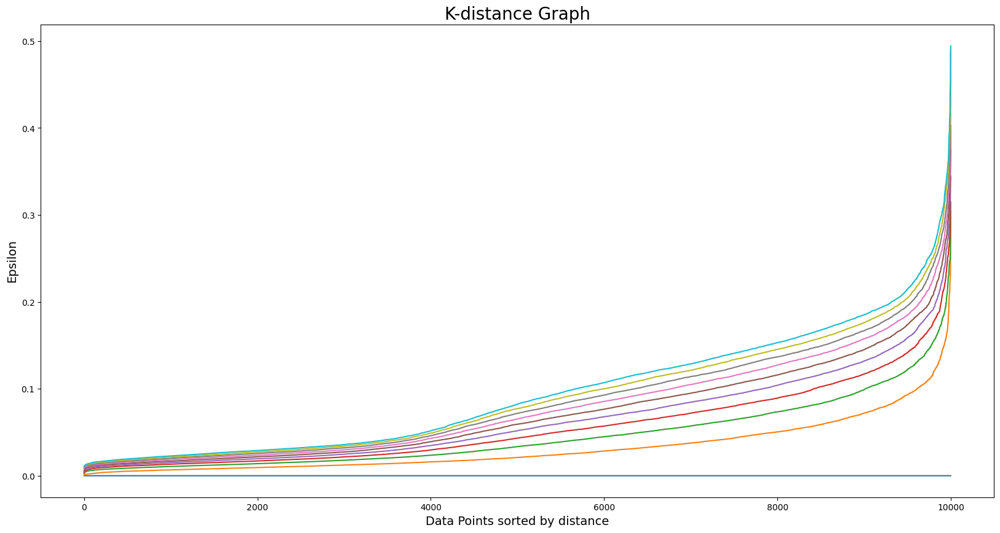

In [44]:
neigh = NearestNeighbors(n_neighbors = 10)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)

# Отобразим график расстояний между точками
distances = np.sort(distances, axis = 0)
distances = distances[:]
plt.figure(figsize = (20, 10))
plt.plot(distances)
plt.title('K-distance Graph', fontsize = 20)
plt.xlabel('Data Points sorted by distance', fontsize = 14)
plt.ylabel('Epsilon', fontsize = 14)
plt.show()

0.182428238865014


<Figure size 2000x1000 with 0 Axes>

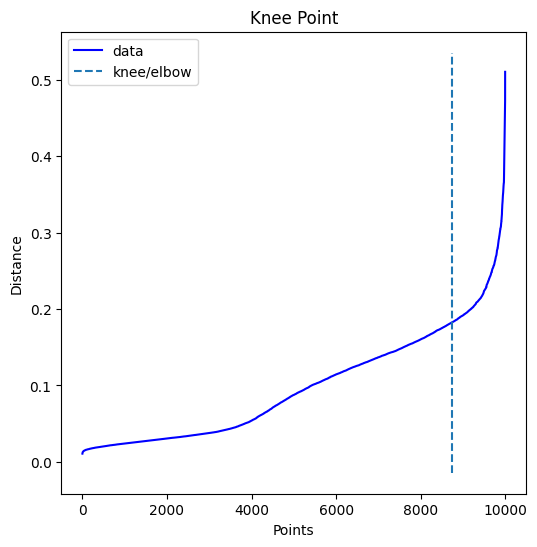

In [45]:
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(X)
distances, indices = neighbors.kneighbors(X)
distances = np.sort(distances[:,10], axis=0)

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
fig = plt.figure(figsize=(20, 10))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [345]:
%%time
pca_eps_values = np.arange(0.01,1,0.01) 
pca_min_samples = np.arange(1,300,1) 

pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(X)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
        #pca_sil_score.append(silhouette_score(X, pca_dbscan_cluster.labels_))
pca_eps_min = list(zip(pca_no_of_clusters,pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'epsilon_values', 'minimum_points'])
pca_eps_min_df


CPU times: user 2h 42s, sys: 4min 42s, total: 2h 5min 24s
Wall time: 3h 46min 24s


,no_of_clusters,epsilon_values,minimum_points
0,8974,0.01,1
1,684,0.01,2
2,182,0.01,3
3,51,0.01,4
4,22,0.01,5
...,...,...,...
29596,1,0.99,295
29597,1,0.99,296
29598,1,0.99,297
29599,1,0.99,298


In [346]:
pca_eps_min_df_copy = pca_eps_min_df[pca_eps_min_df['no_of_clusters']>3]
pca_eps_min_df_copy

,no_of_clusters,epsilon_values,minimum_points
0,8974,0.01,1
1,684,0.01,2
2,182,0.01,3
3,51,0.01,4
4,22,0.01,5
...,...,...,...
17038,4,0.57,295
17039,4,0.57,296
17040,4,0.57,297
17041,4,0.57,298


In [347]:
pca_eps_min_df_copy = pca_eps_min_df_copy[pca_eps_min_df_copy['no_of_clusters']<8]
pca_eps_min_df_copy

,no_of_clusters,epsilon_values,minimum_points
5,6,0.01,6
311,7,0.02,13
312,7,0.02,14
313,4,0.02,15
615,7,0.03,18
...,...,...,...
17038,4,0.57,295
17039,4,0.57,296
17040,4,0.57,297
17041,4,0.57,298


In [348]:
pca_eps_min_df_copy_4 = pca_eps_min_df_copy[pca_eps_min_df_copy['no_of_clusters']==4]
pca_eps_min_df_copy_4

,no_of_clusters,epsilon_values,minimum_points
313,4,0.02,15
621,4,0.03,24
622,4,0.03,25
932,4,0.04,36
933,4,0.04,37
...,...,...,...
17038,4,0.57,295
17039,4,0.57,296
17040,4,0.57,297
17041,4,0.57,298


In [349]:
pca_eps_min_df_copy_5 = pca_eps_min_df_copy[pca_eps_min_df_copy['no_of_clusters']==5]
pca_eps_min_df_copy_5

,no_of_clusters,epsilon_values,minimum_points
616,5,0.03,19
617,5,0.03,20
618,5,0.03,21
925,5,0.04,29
931,5,0.04,35
...,...,...,...
16141,5,0.54,295
16142,5,0.54,296
16143,5,0.54,297
16144,5,0.54,298


In [356]:
#df = pca_eps_min_df_copy_5.drop_duplicates(subset='epsilon_values')
df = pca_eps_min_df_copy_5.drop('no_of_clusters',axis=1).groupby('epsilon_values', as_index=False).mean()
df

,epsilon_values,minimum_points
0,0.03,20.000000
1,0.04,34.000000
2,0.05,41.500000
3,0.06,55.375000
4,0.07,41.000000
5,0.08,61.000000
6,0.09,73.600000
7,0.10,86.461538
8,0.11,108.120482
9,0.12,116.201923


In [366]:
df2 = pca_eps_min_df_copy_5.drop('no_of_clusters',axis=1).groupby('epsilon_values', as_index=False).min()
df2

,epsilon_values,minimum_points
0,0.03,19
1,0.04,29
2,0.05,39
3,0.06,51
4,0.07,41
5,0.08,49
6,0.09,58
7,0.10,53
8,0.11,54
9,0.12,60


In [380]:
df3 = pca_eps_min_df_copy_5.drop('no_of_clusters',axis=1).groupby('epsilon_values', as_index=False).median()
df3

,epsilon_values,minimum_points
0,0.03,20.0
1,0.04,35.0
2,0.05,41.5
3,0.06,55.5
4,0.07,41.0
5,0.08,51.0
6,0.09,62.5
7,0.10,93.0
8,0.11,109.0
9,0.12,118.5


In [581]:
%%time
pca_eps_values = np.arange(0.1,0.2,0.001) 
pca_min_samples = np.arange(10,50,1) 

pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(X)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
        #pca_sil_score.append(silhouette_score(X, pca_dbscan_cluster.labels_))
pca_eps_min = list(zip(pca_no_of_clusters,pca_epsvalues, pca_min_samp))
pca_eps_min_df_re = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'epsilon_values', 'minimum_points'])
pca_eps_min_df_re

CPU times: user 6min 38s, sys: 4.52 s, total: 6min 42s
Wall time: 7min 4s


,no_of_clusters,epsilon_values,minimum_points
0,83,0.100,10
1,73,0.100,11
2,64,0.100,12
3,48,0.100,13
4,37,0.100,14
...,...,...,...
3995,16,0.199,45
3996,14,0.199,46
3997,12,0.199,47
3998,12,0.199,48


In [586]:
pca_eps_min_df_re_copy = pca_eps_min_df_re[pca_eps_min_df_re['no_of_clusters']==5]
pca_eps_min_df_re_copy

,no_of_clusters,epsilon_values,minimum_points
3043,5,0.176,13
3083,5,0.177,13
3163,5,0.179,13
3203,5,0.180,13
3243,5,0.181,13
3283,5,0.182,13
3365,5,0.184,15
3366,5,0.184,16
3405,5,0.185,15
3406,5,0.185,16


In [686]:
p = pd.DataFrame(new_pcd)
p

ValueError: DataFrame constructor not properly called!

In [860]:
clustering = DBSCAN(eps=0.1697, min_samples=17, algorithm='ball_tree').fit(X)

labels=clustering.labels_
  
max_label = labels.max() + 1 # if not < min clusters!!!


unique_labels, counts = np.unique(labels, axis=0, return_counts=True)
dic = dict(zip(unique_labels, counts))
print(dic)

# max_labels = unique_labels[-4:]
num_of_points = 3
indexes_of_max = []
for i in range(4):
    for j in range(num_of_points):
        indexes_of_max.append(np.where(labels==i)[0][randrange(counts[i+1])])
print(indexes_of_max)


min_dist_index_list = []

for i in range(4, max_label):
    index = np.where(labels==i)[0][0]
    print(i, ": ", index)
    for j in range(num_of_points):
        min_dist = 1000
        for k in range(4):
            dist = math.dist(X[index], X[indexes_of_max[j+k*num_of_points]])
            if (dist <= min_dist):
                min_dist = dist
                min_dist_index = k
        min_dist_index_list.append(min_dist_index)
    labels[labels==i] = max(set(min_dist_index_list), key=min_dist_index_list.count)

print(np.where(labels==-1)[0][571])
# max_labels[0]

# labels[labels.argmax()]

# obj_points=[]
# for i in range(max_label):
# idx_labels = np.where(labels==i)
# obj_points.append(points[idx_labels])

# idx_layer=np.where(labels<0)
# colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
# colors[labels < 0] = 0
# pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

  #return pcd, colors, max_label, obj_points

{-1: 1038, 0: 1924, 1: 2388, 2: 2058, 3: 1444, 4: 32, 5: 345, 6: 95, 7: 202, 8: 125, 9: 211, 10: 62, 11: 27, 12: 14, 13: 19, 14: 16}
[8285, 4502, 6077, 8566, 9971, 7415, 9796, 5835, 6668, 5039, 4694, 2958]
4 :  11
5 :  0
6 :  27
7 :  44
8 :  55
9 :  58
10 :  488
11 :  415
12 :  179
13 :  83
14 :  1021
5433
